# Data field descriptions from RSNA pneumonia dataset:

- patientId- A patientId. Each patientId corresponds to a unique image.
- x - the upper-left x coordinate of the bounding box.
- y - the upper-left y coordinate of the bounding box.
- width - the width of the bounding box.
- height - the height of the bounding box.
- Target - the binary Target, indicating whether this sample has evidence of pneumonia.

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_detailed_class_info.csv
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_sample_submission.csv
/kaggle/input/rsna-pneumonia-detection-challenge/GCP Credits Request Link - RSNA.txt
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/1044cdf6-d7b5-4e65-b569-10418f948419.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/1cad996a-c21c-46c8-aa09-95aa8220efa5.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/2fa863e7-65e0-4808-a1c2-5e15b8157470.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/102b3230-f521-48e9-807f-7f219d6778e6.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/1ecf47f9-3905-4518-b171-bc58cdac5e54.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/2ce9bd15-5511-4fc8-865d-d23ab1321bf8.dcm
/kaggle/input/rsna-pn

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/0daea621-2fce-4908-9551-0e219d760c7f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/0e545167-0db9-44bd-acf2-ce879af3ebda.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/c1b72754-10ab-492b-ad36-78a4b16365eb.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/010f1670-a3f9-4186-b54f-720e3a78b9fd.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/03ff2e8b-e8c6-4a63-a426-f06c9a76d1ac.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/14dab443-4e8a-40cb-8992-90b2d593be11.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/23b839c3-ece6-4daf-9b58-c347c598d42f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/2cc5ea9a-77a5-4d7f-9b54-9cc15c496730.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_test_images/2d17ce84-86f9-4153-8d91-3a75ffe303cc.dcm
/kaggle/in

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/3e120bed-fc23-42ac-85e6-59a28a1d215a.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e01cee30-c1b4-4034-8a52-bda150e93bd4.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/32652bc7-21e2-4aa4-ae0c-461950e4c131.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/3fb227fe-ba26-4682-ae1f-0e19dee31876.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/45e92e87-9e8e-4783-ba97-c032c17864da.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/bb0fbd66-925e-487a-bdb6-9f172febd768.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e8a6ccf4-845e-4663-b561-008bdf13c7fd.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/09547f4f-c52e-4fd7-8738-0e01e6277034.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a0c12b73-11a4-4ad2-815a-f8a818d39795.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/f6527579-0d96-459a-9c36-0b0047308bc6.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a0688bb5-65a3-4b02-b0a5-cd0dc775608d.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/97b0ce05-4da2-4ec6-a48b-786b8562dd82.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/4fbbc333-2706-48f9-9d57-137b372a5a5c.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/7e85ffa0-ad3c-4475-8ca4-3cbb92a6a394.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/99ae82f9-44a4-4aeb-b946-e387488c8915.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ebd485b0-e788-44e2-8f85-a98a6cb2d153.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/631f9025-e04f-47c4-8db1-de7ddf0c8b60.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ec32088f-f33e-454f-bb07-43283d05194a.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/9c68beeb-e133-426e-831b-2f8266c978d7.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/c4567429-7189-4603-ae34-7cbf3a8b6c07.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/d086792f-5d97-473c-b0f3-291385da233f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/44c1c93f-adc8-498b-8a42-821ef7028072.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/96b3d885-ac5f-4ccb-ae8b-2c7352bec348.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b2103ba0-f721-45a3-876e-c4e53ebfe890.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/828a07b4-78cc-4ec6-8f16-863a6b308ade.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/0cea4fac-4e84-4857-ac38-f2eb0dacfffc.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/eb82b8a8-8710-4364-bb9b-8dcfe0edf813.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/c95fb39a-39cd-4c2f-ba30-a33ba91e65f3.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/16066352-b81b-4957-b7eb-974e66a54912.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/167c8c5b-551b-4c01-b208-0d8d7f35a6a4.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e7b4b4e3-97cb-499a-8f26-14763f49a153.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/f2188da3-8dde-46e6-b94b-23ffd90126ce.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a3d9e81b-9de4-4d4c-8449-327ba2875585.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/9f765527-a937-42be-9e95-d673b2ad97e2.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/5b23de86-c4a5-4c55-b38f-18155a87930a.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a34abb30-f9a7-4967-987f-d7a99e132d1a.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ac88c984-77c4-4407-ac9b-157861501eec.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/bebdcf14-c068-400b-b006-9d4169e18fb1.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b4122129-c965-43e9-afa7-f603787a9297.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/04707463-aae0-4989-ae73-f9162275444e.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/770c117a-75c6-4b1e-8ee9-f28a7014adcc.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a8c437c7-4363-43d6-a6f9-47d242e15a4e.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/01fdfd88-7607-48b9-ba05-a36e8b6fd19b.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/54a3d1e0-88fa-4027-9a5a-3b0dd9fd8c98.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/d6cb8162-9a5b-4ec4-8d78-bc9933367ade.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/63ec0f9c-054b-494e-ac23-29b36e6b438a.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a95f5aa0-dcd7-4e08-ab91-832ce6f25055.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/62974b0f-cf3d-452d-b038-7e9ded3aa5cc.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/87e6c696-1388-4d69-aad2-e8c28d5b4f38.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/6851fb69-3777-49a6-a1bb-632c34316799.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/08cbc4cf-9efb-47e4-a77f-d734e6a273c5.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/60d42b93-cacf-43df-813c-5e1034312e7f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/02c7fec6-46d9-480a-9ccc-edccfbbb44ab.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a519b208-807c-469e-a13b-d2eecf56007f.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/cb1bf059-6398-45bb-9dc0-5c3c993dfad3.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/5ec26c98-e47e-492c-bae7-5b87420ab5e5.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ad49beb0-b610-4b07-adf1-60b4a6413159.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/aa1b8a2a-59cc-49fa-b38c-a3fe2767ee15.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b1827a4d-c98c-4719-8296-1659617870a7.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a27e7dc6-1003-4059-a14e-a39a16b76896.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/78abc3f5-ac62-4e42-a6b4-1c44e09cb566.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/7c84bee5-a16e-48c7-b84a-6b61b0d62ce9.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/09d79f22-df14-4e5a-bc98-7a1d6bcd6965.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/67cbdff5-178b-4da2-9a0e-7c7ab1bdcaf1.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/160ad42c-c2a4-408f-85fd-f22f5d166856.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/6f6b253a-54ad-4b30-aa6e-581f3f32065f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/1a4326c3-303c-4140-8747-ae962f87a981.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/8f0c3e23-9e1e-4968-a1ce-ec29f4520f3d.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/597e0a5b-8005-41c7-9a15-3da33b415d72.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/7e681e62-cfee-462a-b7ec-78a1c1848738.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/c8115b22-d345-40b7-81d8-0c7158919674.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a1232a0d-19ec-41a6-9f93-c64bb3c44340.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/818c3ac1-b27c-4d9e-8849-f97127647c97.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/94c5c772-94d2-45e1-ba8b-ea88b5fcd325.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/30f2c879-2104-45e4-acbd-6284f7a62d35.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/4c30114d-2e03-43b7-9bc2-48ce5e8851ab.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/74c665ca-a728-44bc-8131-8e15ec862cbf.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/4f0ee67b-d4c2-41e2-96eb-89fd7287844d.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/52a85d13-7aee-4236-a9a5-16d9a58ad4b5.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b526da79-78c9-476e-8f3f-821a57c900ab.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/3df0327c-2a52-4e32-ac15-1f0d287a9744.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/8c148eb8-5753-4d84-b4b0-9c3dc5fa5cab.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a281a261-8435-4861-bea0-0bca497dc5a2.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/86de3306-5876-4f2f-af07-fbc00610df8b.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a748125f-da50-4ada-9517-0f60e67e2c48.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/0fcd4b17-359c-40bf-a21c-907d0a91b5df.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a7714d9a-c359-4edd-94a4-c6943c437021.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/d798aa5b-28ef-463e-81a1-c05c83dcdebb.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b34524bc-e812-4067-a0e8-bd7185bfb814.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/7f0ae9ec-6533-46f0-a40d-7cf0b4843431.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/80be4d23-bdd7-4b44-9ce9-0c269584eb61.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/be590287-c599-4d86-8308-ac6cdb760eae.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ba6db8f2-d7a4-483a-bf42-7ab2e83f040f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e912a77a-18b3-4d94-8c70-9f15fc32b47b.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/3b84f97b-fa88-424a-891c-e57c3b92c062.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/edc9aa16-1f19-46cf-8785-2c1bb4f0c534.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/8b31fa8e-9b16-4185-b7e3-2cead2a6f4ea.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/6db53e07-4656-47e7-bed7-5782fd117f91.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/91b0043a-35bd-4cf9-b338-1cbc9b05b76d.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b40198e7-7596-4736-aa0a-1a5910bc4319.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/8c90906b-b272-4ad8-ba3c-9a6faf0e03f4.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/3c625ae7-a036-4bf1-9984-257e233ed907.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/b3c6be40-8ed6-4fcb-b688-bf1779be8f5d.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a2f0b32a-6788-481b-879c-49c88e2407bb.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/4e60231e-3d1b-40b5-bbeb-d8b136cbad6c.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a6b939a7-1734-425c-a4a5-0ad0422cb932.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/742640b8-5c3a-4c8c-8296-18f5613758ff.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ece9ecd0-64b4-4672-b0af-96d0a147b3cd.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/34533320-e0b8-4286-9909-5587fee2a9d0.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/c440c843-c900-4d47-b9da-af78f701b86f.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/49b95513-daab-49bb-bc6e-c5254ab1bc07.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/567dee1f-ac03-4f7c-b944-d65b58c575a9.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/06df5d57-6f34-43c0-99ad-b9b5f9346cbd.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/0b48e8f1-1f33-47ea-8cd1-1c65ae26ad72.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/3a183229-e56b-4c3e-9d3c-127adec8a2f3.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/a93c3646-b52d-4dd6-b0b5-40c7fed693bb.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ec8593ff-4f35-41d6-9d66-d7b7e06ce3ac.dcm
/

/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/c2b6c97a-c501-4a9c-b5a1-1dbb07d944cf.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/0b63ee7f-9715-4a4a-a892-2ea49adbed2e.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e3cb6f09-9cef-4faf-a8d8-58a51d657cd0.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e55ac8b2-17a1-4c53-8306-80d2d901a60a.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/ce85247b-3efd-44c4-9b81-b290baae4fef.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/9bc9e813-e815-42a1-aed6-c24e45d59ea4.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/e7b63d9f-6399-425e-be10-e143504c475a.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/db9011c4-185f-4322-938d-ad0416a8357b.dcm
/kaggle/input/rsna-pneumonia-detection-challenge/stage_2_train_images/6cdcd463-82a4-45b7-b780-ef366f9ecc62.dcm
/

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pylab as plt
import pydicom
import os
from os import listdir
from os.path import isfile, join
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix


%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [95]:
bbox_df = pd.read_csv('../input/rsna-pneumonia-detection-challenge/stage_2_train_labels.csv')         # CSV of labeled bounding box information
class_df = pd.read_csv('../input/rsna-pneumonia-detection-challenge/stage_2_detailed_class_info.csv') # CSV with extra detailed_class_info

In [96]:
print('Number of bounding box labels:', len(bbox_df))
print('Number of classes:', len(class_df))

Number of bounding box labels: 30227
Number of classes: 30227


In [97]:
bbox_df.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [98]:
bbox_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB


In [99]:
class_df.head()

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


In [100]:
class_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   patientId  30227 non-null  object
 1   class      30227 non-null  object
dtypes: object(2)
memory usage: 472.4+ KB


In [101]:
print("Bounding Box Shape:", bbox_df.shape)
print("Class info Shape:", class_df.shape)

Bounding Box Shape: (30227, 6)
Class info Shape: (30227, 2)


In [102]:
bbox_df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
patientId,30227,26684,31764d54-ea3b-434f-bae2-8c579ed13799,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x,9555,NaN,NaN,NaN,394.048,204.574,2,207,324,594,835
y,9555,NaN,NaN,NaN,366.84,148.94,2,249,365,478.5,881
width,9555,NaN,NaN,NaN,218.471,59.2895,40,177,217,259,528
height,9555,NaN,NaN,NaN,329.27,157.751,45,203,298,438,942
Target,30227,NaN,NaN,NaN,0.316108,0.464963,0,0,0,1,1


In [103]:
class_df.describe(include='all').transpose()

,count,unique,top,freq
patientId,30227,26684,31764d54-ea3b-434f-bae2-8c579ed13799,4
class,30227,3,No Lung Opacity / Not Normal,11821


In [104]:
print(round((8964 / (8964 + 20025)) * 100, 2), '% of the examples are positive')
pd.DataFrame(bbox_df.groupby('Target')['patientId'].count())

30.92 % of the examples are positive


,patientId
Target,
0,20672
1,9555


In [105]:
data = class_df.merge(bbox_df, on = 'patientId', how = 'left')
data

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...,...
37624,c1f6b555-2eb1-4231-98f6-50a963976431,Normal,NaN,NaN,NaN,NaN,0
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1
37626,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,233.0,424.0,201.0,356.0,1
37627,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1


In [106]:
data.describe(include='all').transpose() # show numerical and string data

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
patientId,37629,26684,31764d54-ea3b-434f-bae2-8c579ed13799,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
class,37629,3,Lung Opacity,16957,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x,16957,NaN,NaN,NaN,398.98,204.869,2,209,343,596,835
y,16957,NaN,NaN,NaN,360.443,149.202,2,243,355,472,881
width,16957,NaN,NaN,NaN,219.267,59.1953,40,178,218,259,528
height,16957,NaN,NaN,NaN,337.8,158.987,45,210,309,452,942
Target,37629,NaN,NaN,NaN,0.450636,0.497564,0,0,0,1,1


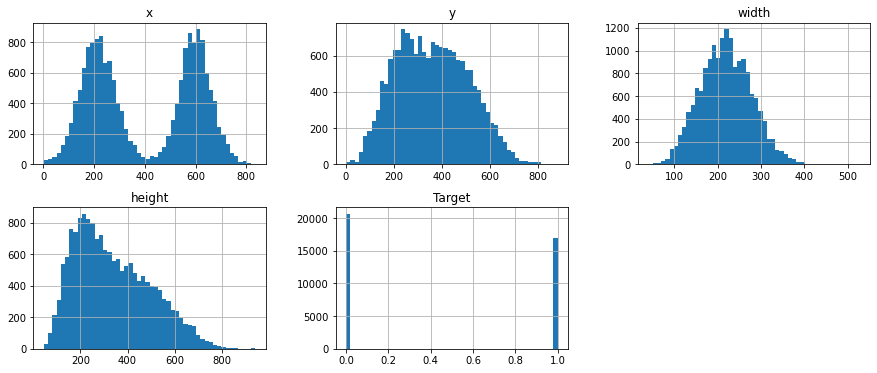

In [109]:
hist = data.hist(bins=50, layout=(2,3), figsize=(15,6))


# Inspect Missing Data

We've defined a function below to inspect the missing data.

data.isnull() return False (0) if a cell is non-empty or True (1) when a cell is null (or NaN).

data.isnull().sum() then counts the number of null rows in every column of data

data.index returns the index of row labels that can quickly be counted to specify number of rows using len(data.index)

pd.concat concatenates pandas Series (a column of pandas data) along an axis and appends appropriate labels.

In [110]:
def missing_data(data):
  null_data = data.isnull().sum()
  num_rows = len(data.index)
  percent_null = 100.*null_data/num_rows
  return pd.concat([null_data, percent_null.round(1)], axis=1, keys=['Missing', 'PercentMissing'])

missing_data(data)

,Missing,PercentMissing
patientId,0,0.0
class,0,0.0
x,20672,54.9
y,20672,54.9
width,20672,54.9
height,20672,54.9
Target,0,0.0


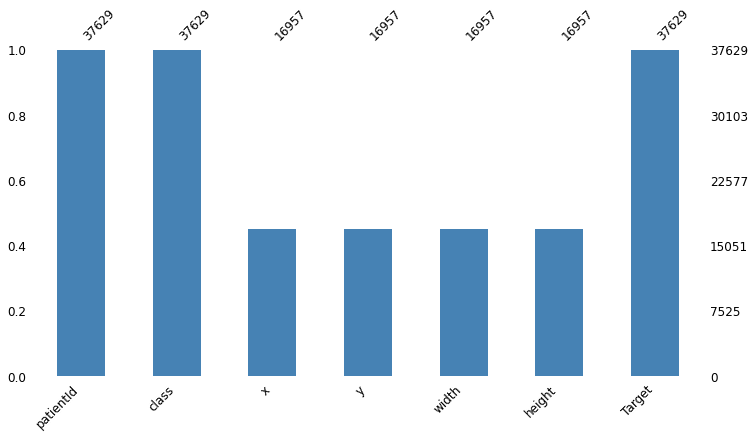

In [111]:
import missingno as msno
import matplotlib.pyplot as plt
msno.bar(data, figsize=(12, 6), fontsize=12, color='steelblue')

In [112]:
data.isnull().sum().sum() # Total number of recognised missing values in the entire dataframe

82688

In [113]:
data.fillna(0, inplace=True)
data
#data.fillna(method = 'bfill', axis=0).fillna(0)

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,0.0,0.0,0.0,0.0,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1
...,...,...,...,...,...,...,...
37624,c1f6b555-2eb1-4231-98f6-50a963976431,Normal,0.0,0.0,0.0,0.0,0
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1
37626,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,233.0,424.0,201.0,356.0,1
37627,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1


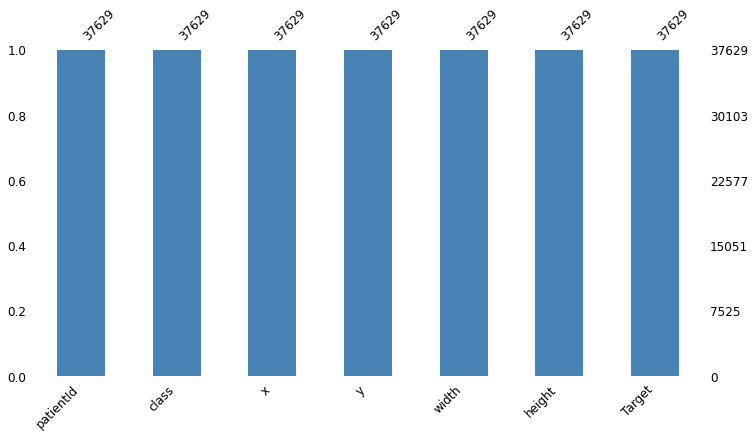

In [114]:
msno.bar(data, figsize=(12, 6), fontsize=12, color='steelblue')

In [115]:
data[data.Target == 0] #This selects all rows of data with Target==0

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,0.0,0.0,0.0,0.0,0
8,00569f44-917d-4c86-a842-81832af98c30,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...
37612,c1cf3255-d734-4980-bfe0-967902ad7ed9,Normal,0.0,0.0,0.0,0.0,0
37613,c1e228e4-b7b4-432b-a735-36c48fdb806f,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0
37614,c1e3eb82-c55a-471f-a57f-fe1a823469da,Normal,0.0,0.0,0.0,0.0,0
37623,c1edf42b-5958-47ff-a1e7-4f23d99583ba,Normal,0.0,0.0,0.0,0.0,0


In [122]:
data[data.Target == 1] #This selects all rows of data with Target==1

,patientId,class,x,y,width,height,Target
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,562.0,152.0,256.0,453.0,1
6,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1
7,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,562.0,152.0,256.0,453.0,1
10,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity,323.0,577.0,160.0,104.0,1
...,...,...,...,...,...,...,...
37622,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,Lung Opacity,185.0,298.0,228.0,379.0,1
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1
37626,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,233.0,424.0,201.0,356.0,1
37627,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1


In [117]:
print("Target 0")
print("="*20)
print(data[data.Target == 0].count())
print("")
print("Target 1")
print("="*20)
print(data[data.Target == 1].count())

Target 0
patientId    20672
class        20672
x            20672
y            20672
width        20672
height       20672
Target       20672
dtype: int64

Target 1
patientId    16957
class        16957
x            16957
y            16957
width        16957
height       16957
Target       16957
dtype: int64


> Number of counts of each unique value in that series and by default sorts the unique labels in by descending value counts.

In [118]:
data['class'].value_counts()

Lung Opacity                    16957
No Lung Opacity / Not Normal    11821
Normal                           8851
Name: class, dtype: int64

In [119]:
data['class'].value_counts()*(100.0)/len(data.index)

Lung Opacity                    45.063648
No Lung Opacity / Not Normal    31.414600
Normal                          23.521752
Name: class, dtype: float64

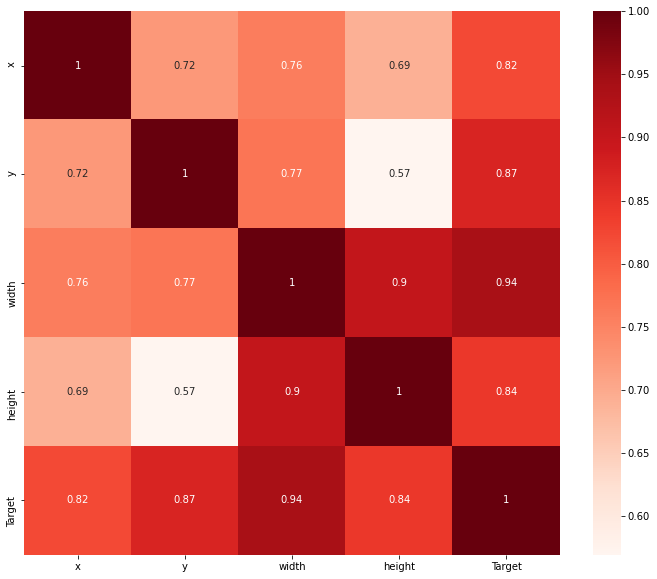

In [116]:
import seaborn as sns
plt.figure(figsize=(12,10))
cor = data.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

> Creates a bar graph of the number of distinct values present in the pandas series.

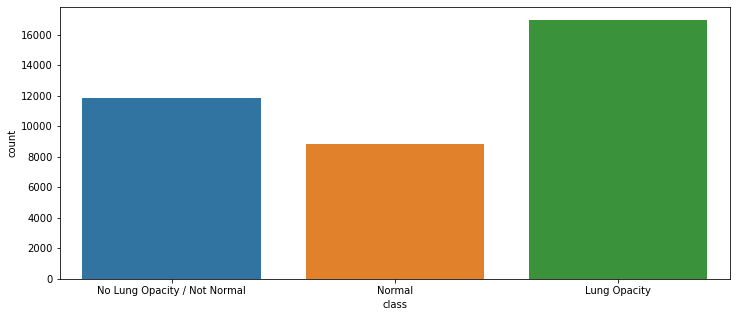

In [123]:
fig=plt.figure(figsize=(12, 5))
countplot = sns.countplot(data['class'])

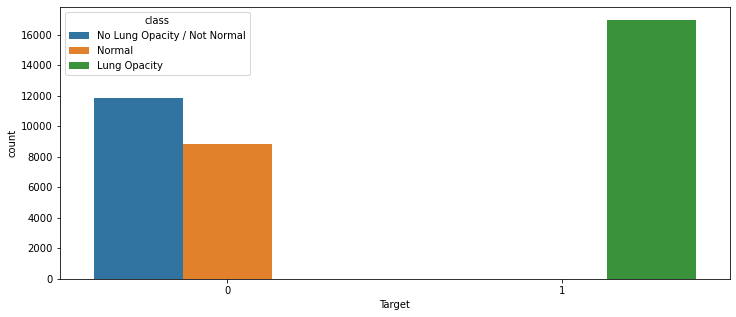

In [124]:
fig=plt.figure(figsize=(12, 5))
target_class_plot = sns.countplot(data=data, x='Target', hue='class')

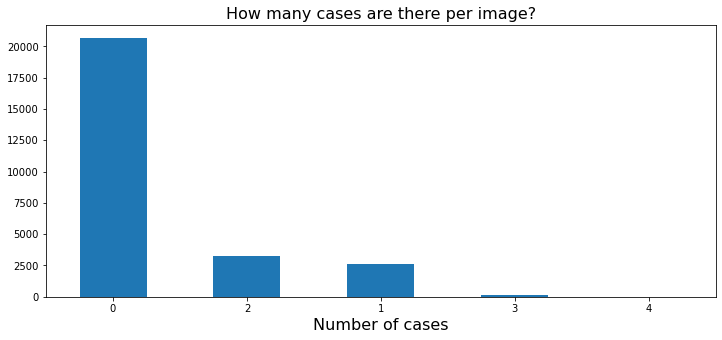

In [125]:
boxes_per_patient = bbox_df.groupby('patientId')['Target'].sum()
fig=plt.figure(figsize=(12, 5))
ax = boxes_per_patient.value_counts().plot.bar()
_ = ax.set_title('How many cases are there per image?', fontsize=16)
_ = ax.set_xlabel('Number of cases', fontsize=16)
_ = ax.xaxis.set_tick_params(rotation=0)

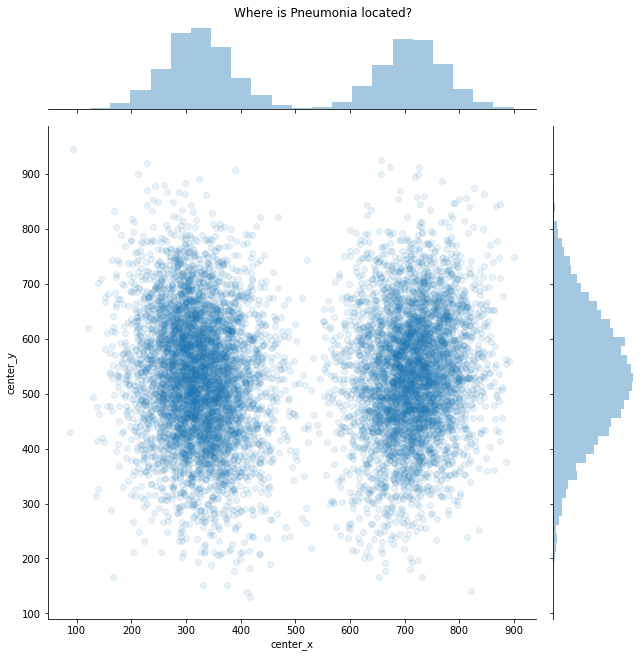

In [126]:
centers = (bbox_df.dropna(subset=['x'])
           .assign(center_x=bbox_df.x + bbox_df.width / 2, center_y=bbox_df.y + bbox_df.height / 2))
ax = sns.jointplot("center_x", "center_y", data=centers, height=9, alpha=0.1)
_ = ax.fig.suptitle("Where is Pneumonia located?", y=1.01)

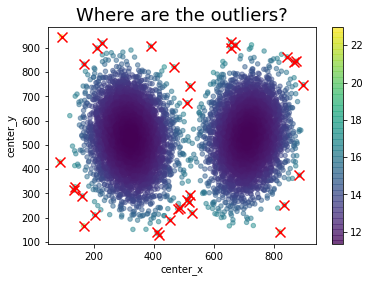

In [127]:

from sklearn.mixture import GaussianMixture

clf = GaussianMixture(n_components=2)
clf.fit(centers[['center_x', 'center_y']])
center_probs = clf.predict_proba(centers[['center_x', 'center_y']])
Z = -clf.score_samples(centers[['center_x', 'center_y']])
outliers = centers.iloc[Z > 17]
fig, ax = plt.subplots()
centers.plot.scatter('center_x', 'center_y', c=Z, alpha=0.5, cmap='viridis', ax=ax)
outliers.plot.scatter('center_x', 'center_y', c='red', marker='x', s=100, ax=ax)
_ = ax.set_title('Where are the outliers?', fontsize=18)


# Plotting density of values when Target = 1
We can observe general distributions of the x, y, width, height, data fields in a distplot. We first plot the x-axis value by the data column we're interested in. We specify kde=true to fit a gaussian kernel density estimate on top of the existing data. We specify 50 bins to spread our data over. We specify color for plot colorization. We use matplotlib to generate a plot with four subplots in a 2x2 grid and put each plot in a specific one of its subplots before showing.

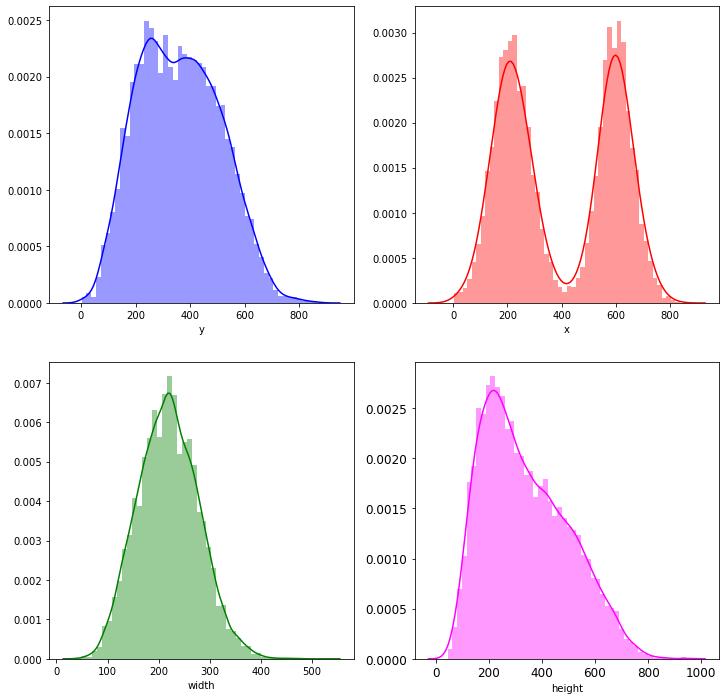

In [128]:
target1_data = data[data['Target']==1]

fig, ax = plt.subplots(2,2, figsize=(12,12))
sns.distplot(target1_data['x'],     kde=True, bins=50, color="red",     ax=ax[0,1])
sns.distplot(target1_data['y'],     kde=True, bins=50, color="blue",    ax=ax[0,0])
sns.distplot(target1_data['width'], kde=True, bins=50, color="green",   ax=ax[1,0])
sns.distplot(target1_data['height'],kde=True, bins=50, color="magenta", ax=ax[1,1])
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

>  For rows where there is bounding box (lung opacity), adding columns named 'xc' and 'yc'

In [129]:
target1_data['xc'] = target1_data['x'] + target1_data['width']/2
target1_data['yc'] = target1_data['y'] + target1_data['height']/2
target1_data.head()

,patientId,class,x,y,width,height,Target,xc,yc
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,370.5,341.5
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,562.0,152.0,256.0,453.0,1,690.0,378.5
6,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,370.5,341.5
7,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,562.0,152.0,256.0,453.0,1,690.0,378.5
10,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity,323.0,577.0,160.0,104.0,1,403.0,629.0


We specify the x-center label xc and the y-center label yc. We specify the range of values for the x and y axis via xlim and ylim respectively. We specify a blending value of 0.5 (0 transparent - 1 opaque)

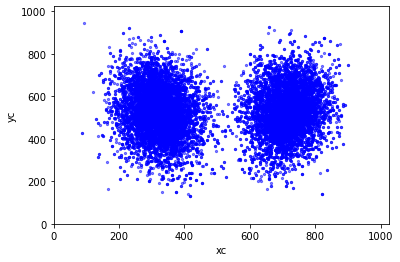

In [130]:
scatter_plot = target1_data.plot.scatter(x='xc', y='yc', xlim=(0,1024), ylim=(0, 1024), alpha=0.5, marker='.', color='blue')

In [131]:
from os import listdir
from os.path import isfile, join
train_images_dir = '../input/rsna-pneumonia-detection-challenge/stage_2_train_images/'
train_images = [f for f in listdir(train_images_dir) if isfile(join(train_images_dir, f))]
test_images_dir ='../input/rsna-pneumonia-detection-challenge/stage_2_test_images/'
test_images = [f for f in listdir(test_images_dir) if isfile(join(test_images_dir, f))] 
print('5 Training images', train_images[:5]) # Print the first 5

5 Training images ['3e120bed-fc23-42ac-85e6-59a28a1d215a.dcm', 'e01cee30-c1b4-4034-8a52-bda150e93bd4.dcm', '32652bc7-21e2-4aa4-ae0c-461950e4c131.dcm', '3fb227fe-ba26-4682-ae1f-0e19dee31876.dcm', '45e92e87-9e8e-4783-ba97-c032c17864da.dcm']


In [132]:
print('Number of train images:', len(train_images))
print('Number of test images:', len(test_images))

Number of train images: 26684
Number of test images: 3000


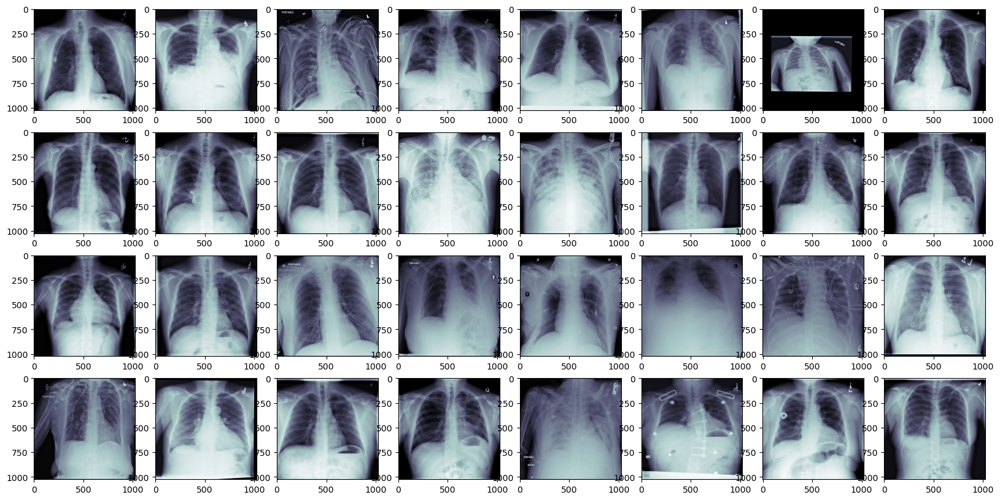

In [133]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    ds = pydicom.dcmread(train_images_dir + train_images[i])
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap=plt.cm.bone)
    fig.add_subplot

# Plotting Bounding Box 

In [134]:
def parse_data(df):
    
    # --- Define lambda to extract coords in list [y, x, height, width]
    extract_box = lambda row: [row['y'], row['x'], row['height'], row['width']]

    parsed = {}
    for n, row in df.iterrows():
        # --- Initialize patient entry into parsed 
        pid = row['patientId']
        if pid not in parsed:
            parsed[pid] = {
                'dicom': '../input/rsna-pneumonia-detection-challenge/stage_2_train_images/%s.dcm' % pid,
                'label': row['Target'],
                'boxes': []}

        # --- Add box if opacity is present
        if parsed[pid]['label'] == 1:
            parsed[pid]['boxes'].append(extract_box(row))

    return parsed

parsed = parse_data(data)

def draw(data):
    """
    Method to draw single patient with bounding box(es) if present 

    """
    # --- Open DICOM file
    d = pydicom.read_file(data['dicom'])
    im = d.pixel_array

    # --- Convert from single-channel grayscale to 3-channel RGB
    im = np.stack([im] * 3, axis=2)

    # --- Add boxes with random color if present
    for box in data['boxes']:
        #rgb = np.floor(np.random.rand(3) * 256).astype('int')
        rgb = [255, 251, 204] # Just use yellow
        im = overlay_box(im=im, box=box, rgb=rgb, stroke=15)

    plt.imshow(im, cmap=plt.cm.gist_gray)
    plt.axis('off')

def overlay_box(im, box, rgb, stroke=2):
    """
    Method to overlay single box on image

    """
    # --- Convert coordinates to integers
    box = [int(b) for b in box]
    
    # --- Extract coordinates
    y1, x1, height, width = box
    y2 = y1 + height
    x2 = x1 + width

    im[y1:y1 + stroke, x1:x2] = rgb
    im[y2:y2 + stroke, x1:x2] = rgb
    im[y1:y2, x1:x1 + stroke] = rgb
    im[y1:y2, x2:x2 + stroke] = rgb

    return im

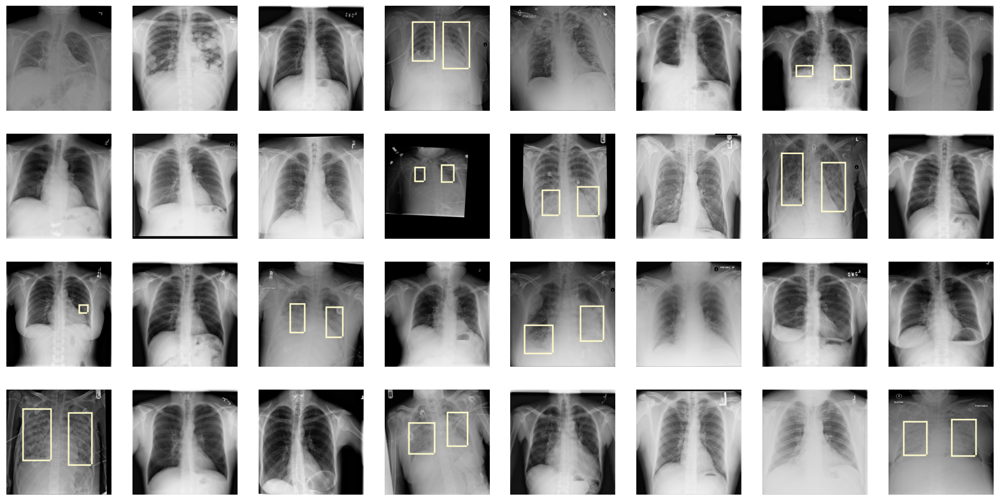

In [135]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[data['patientId'].unique()[i]])
    fig.add_subplot

# A closer look at a Positive and Negative Example

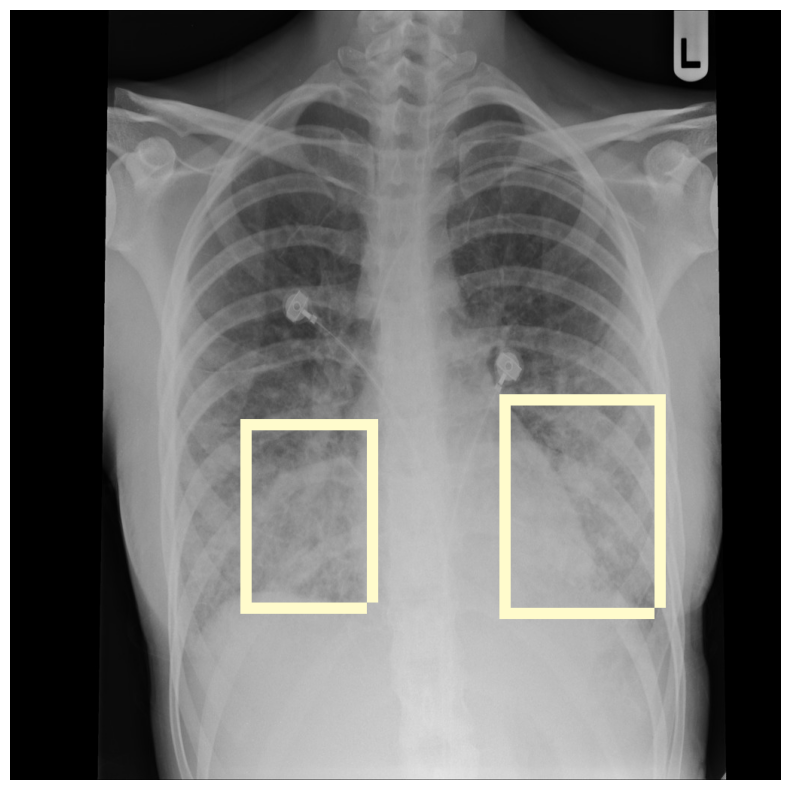

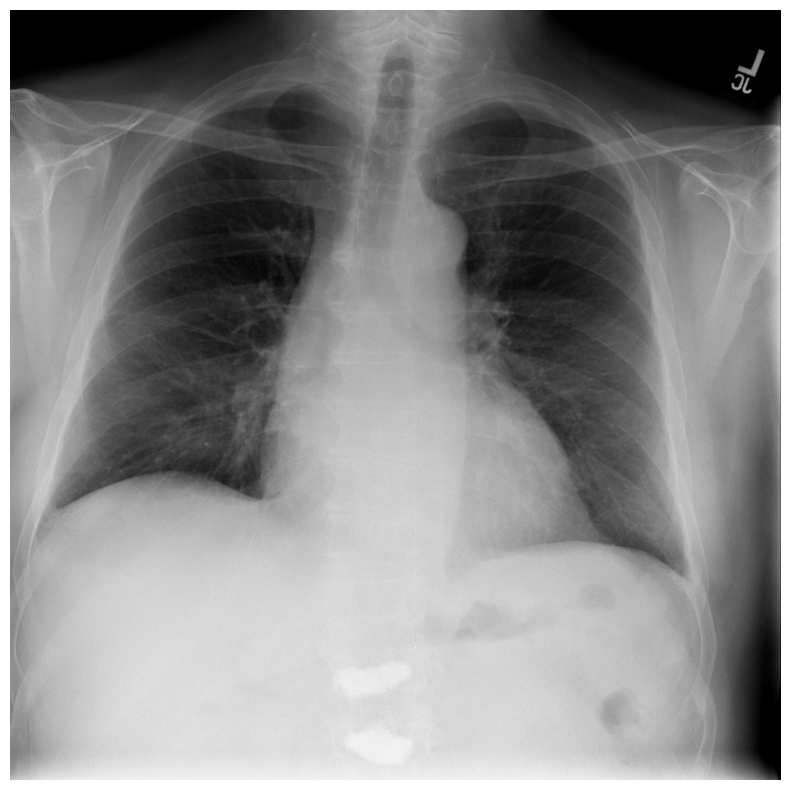

In [136]:
fig=plt.figure(figsize=(20, 10))
draw(parsed[data['patientId'].loc[23]])
plt.show()
fig=plt.figure(figsize=(20, 10))
draw(parsed[data['patientId'].loc[15]])
plt.show()

# Images of Each Label Type

In [137]:
opacity = class_df \
    .loc[class_df['class'] == 'Lung Opacity'] \
    .reset_index()
not_normal = class_df \
    .loc[class_df['class'] == 'No Lung Opacity / Not Normal'] \
    .reset_index()
normal = class_df \
    .loc[class_df['class'] == 'Normal'] \
    .reset_index()

# Lung Opacity Examples

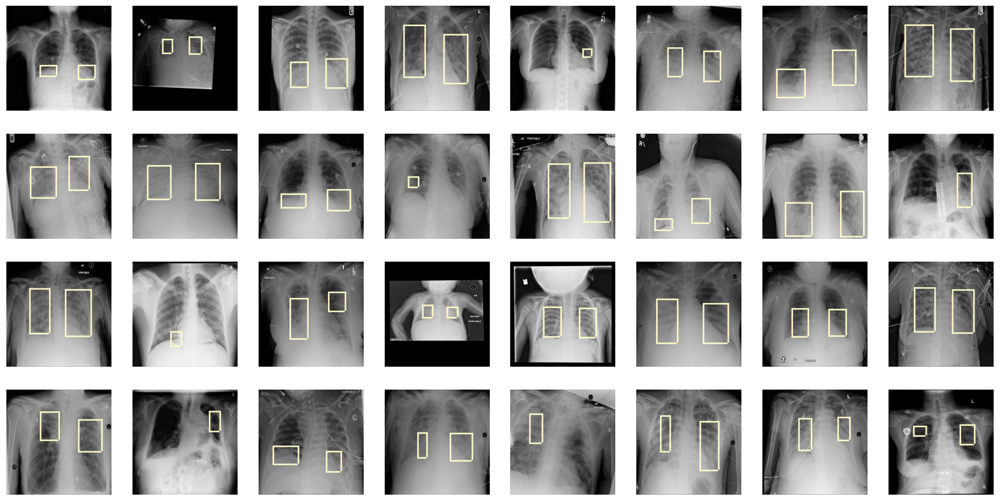

In [138]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[opacity['patientId'].unique()[i]])

# No Lung Opacity / Not Normal Examples

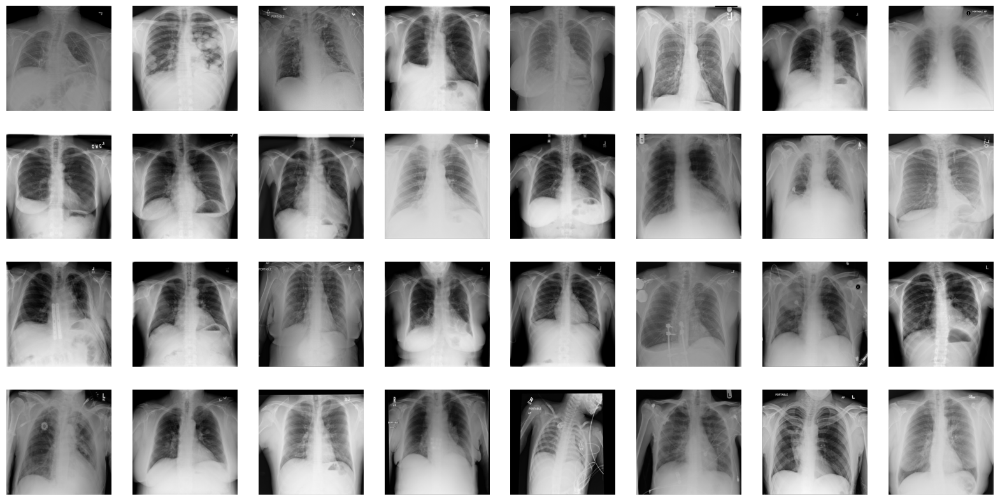

In [139]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[not_normal['patientId'].loc[i]])

# Normal Examples

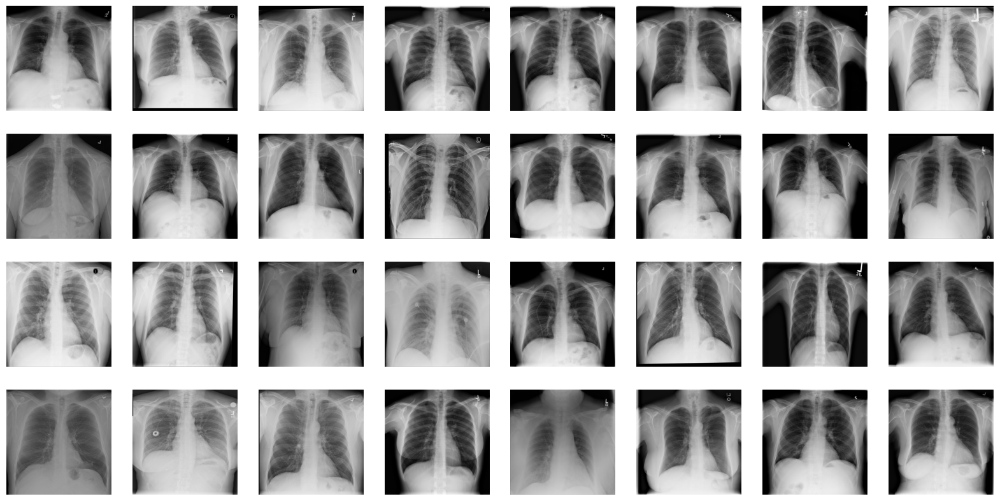

In [140]:
plt.style.use('default')
fig=plt.figure(figsize=(20, 10))
columns = 8; rows = 4
for i in range(1, columns*rows +1):
    fig.add_subplot(rows, columns, i)
    draw(parsed[normal['patientId'].loc[i]])

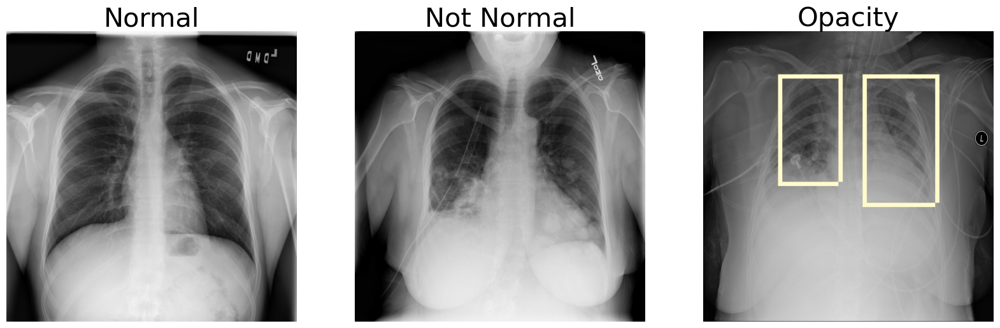

In [141]:
fig=plt.figure(figsize=(20, 10))
columns = 3; rows = 1
fig.add_subplot(rows, columns, 1).set_title("Normal", fontsize=30)
draw(parsed[normal['patientId'].unique()[0]])
fig.add_subplot(rows, columns, 2).set_title("Not Normal", fontsize=30)
# ax2.set_title("Not Normal", fontsize=30)
draw(parsed[not_normal['patientId'].unique()[0]])
fig.add_subplot(rows, columns, 3).set_title("Opacity", fontsize=30)
# ax3.set_title("Opacity", fontsize=30)
draw(parsed[opacity['patientId'].unique()[0]])

In [142]:
count_labels_per_patient = class_df.groupby('patientId').count()

# Number of Labels
Patients that have more than one labels 

In [143]:
count_labels_per_patient.reset_index().groupby('class').count()

,patientId
class,
1,23286
2,3266
3,119
4,13


In [144]:
# Patients with 4 Labels
count_labels_per_patient.sort_values('class', ascending=False).head()

,class
patientId,
76f71a93-8105-4c79-a010-0cfa86f0061a,4
1bf08f3b-a273-4f51-bafa-b55ada2c23b5,4
0ab261f9-4eb5-42ab-a9a5-e918904d6356,4
0e03c2d7-9cea-4dc7-8e91-794a8b3ff58d,4
1c44e0a4-4612-438f-9a83-8d5bf919cb67,4


In [145]:
class_df.loc[class_df['patientId'] == '76f71a93-8105-4c79-a010-0cfa86f0061a']

,patientId,class
11440,76f71a93-8105-4c79-a010-0cfa86f0061a,Lung Opacity
11441,76f71a93-8105-4c79-a010-0cfa86f0061a,Lung Opacity
11442,76f71a93-8105-4c79-a010-0cfa86f0061a,Lung Opacity
11443,76f71a93-8105-4c79-a010-0cfa86f0061a,Lung Opacity


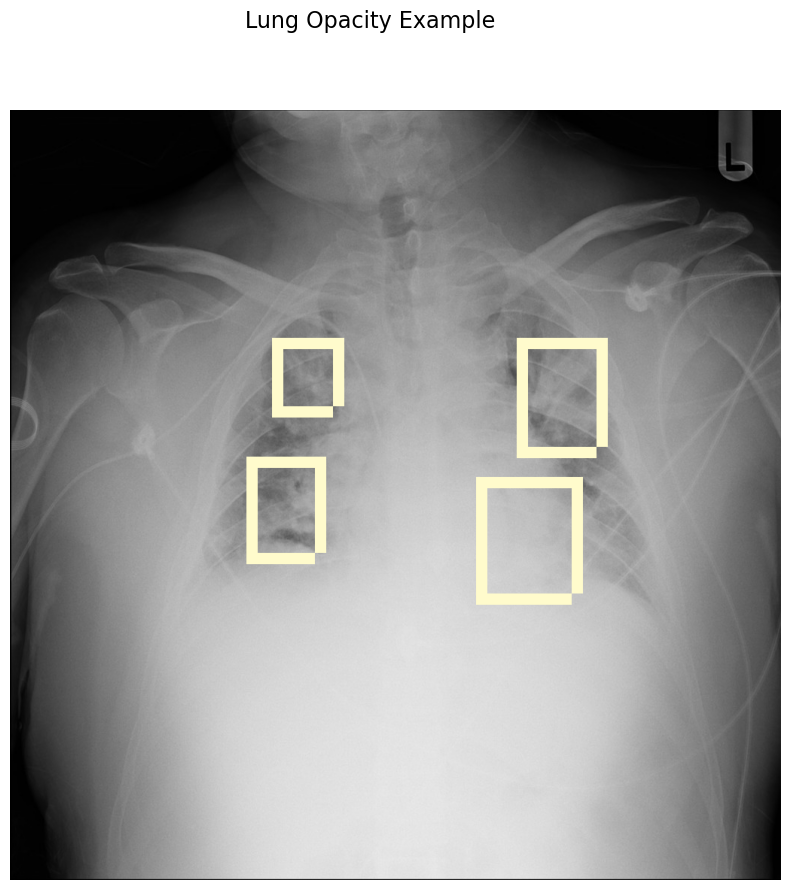

In [146]:
fig=plt.figure(figsize=(20, 10))
plt.suptitle('Lung Opacity Example', fontsize=16)
draw(parsed['76f71a93-8105-4c79-a010-0cfa86f0061a'])

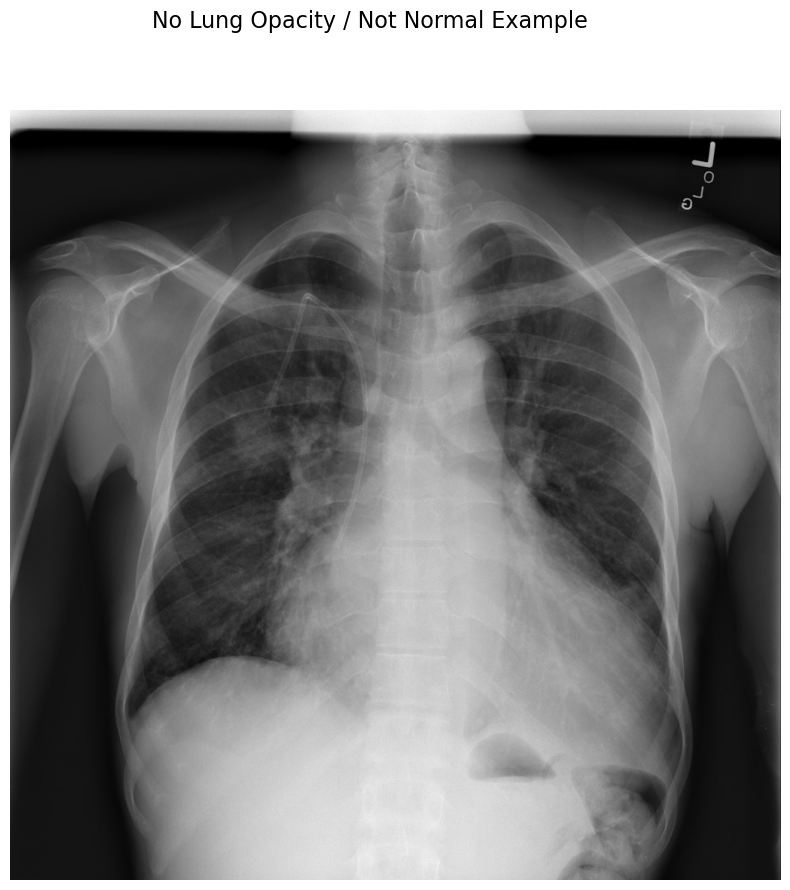

In [147]:
not_normal = class_df.loc[class_df['class'] == 'No Lung Opacity / Not Normal']
not_normal_example = not_normal['patientId']
fig=plt.figure(figsize=(20, 10))
plt.suptitle('No Lung Opacity / Not Normal Example', fontsize=16)
draw(parsed['019e035e-2f82-4c66-a198-57422a27925f'])

# Create dataFrame with names of Images and patientId

First, let's convert this python list into a 1 column pandas dataframe.

Then we add a second column based on truncating the last 4 characters (.dcm) off each string to get the patientId corresponding to each image.

In [148]:
images_df = pd.DataFrame(train_images, columns=['file_name'])
images_df['patientId'] = images_df['file_name'].str[:-4] # add a with patientId column taken from file name
images_df

,file_name,patientId
0,3e120bed-fc23-42ac-85e6-59a28a1d215a.dcm,3e120bed-fc23-42ac-85e6-59a28a1d215a
1,e01cee30-c1b4-4034-8a52-bda150e93bd4.dcm,e01cee30-c1b4-4034-8a52-bda150e93bd4
2,32652bc7-21e2-4aa4-ae0c-461950e4c131.dcm,32652bc7-21e2-4aa4-ae0c-461950e4c131
3,3fb227fe-ba26-4682-ae1f-0e19dee31876.dcm,3fb227fe-ba26-4682-ae1f-0e19dee31876
4,45e92e87-9e8e-4783-ba97-c032c17864da.dcm,45e92e87-9e8e-4783-ba97-c032c17864da
...,...,...
26679,c9c976bf-b105-4b7d-ba23-e2922186c95f.dcm,c9c976bf-b105-4b7d-ba23-e2922186c95f
26680,5333966d-cb93-4e51-b882-ee5502cf6486.dcm,5333966d-cb93-4e51-b882-ee5502cf6486
26681,5f023b2a-6375-4193-96d3-c8b69e19689f.dcm,5f023b2a-6375-4193-96d3-c8b69e19689f
26682,24ef2877-64ae-4c8a-acb5-6e1c302dc7d2.dcm,24ef2877-64ae-4c8a-acb5-6e1c302dc7d2


In [149]:
# Create merged_df by merging the newly created dataframe (with image names and patientId)
merged_df = data.merge(images_df, on='patientId', how='left')
merged_df

,patientId,class,x,y,width,height,Target,file_name
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,0004cfab-14fd-4e49-80ba-63a80b6bddd6.dcm
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,00313ee0-9eaa-42f4-b0ab-c148ed3241cd.dcm
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,00322d4d-1c29-4943-afc9-b6754be640eb.dcm
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,0.0,0.0,0.0,0.0,0,003d8fa0-6bf1-40ed-b54c-ac657f8495c5.dcm
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,00436515-870c-4b36-a041-de91049b9ab4.dcm
...,...,...,...,...,...,...,...,...
37624,c1f6b555-2eb1-4231-98f6-50a963976431,Normal,0.0,0.0,0.0,0.0,0,c1f6b555-2eb1-4231-98f6-50a963976431.dcm
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm
37626,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,233.0,424.0,201.0,356.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm
37627,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm


In [150]:
print("Unique patientId in merged_df: ", merged_df['patientId'].nunique())

Unique patientId in merged_df:  26684


> Exploring Patients With Multiple Rows with groupby

In [151]:
grouped_by_patient = merged_df.groupby(['patientId'])
grouped_by_patient.count() # shows how many times is present per value of 'patientId'

,class,x,y,width,height,Target,file_name
patientId,,,,,,,
0004cfab-14fd-4e49-80ba-63a80b6bddd6,1,1,1,1,1,1,1
000924cf-0f8d-42bd-9158-1af53881a557,1,1,1,1,1,1,1
000db696-cf54-4385-b10b-6b16fbb3f985,4,4,4,4,4,4,4
000fe35a-2649-43d4-b027-e67796d412e0,4,4,4,4,4,4,4
001031d9-f904-4a23-b3e5-2c088acd19c6,4,4,4,4,4,4,4
...,...,...,...,...,...,...,...
fffb2395-8edd-4954-8a89-ffe2fd329be3,4,4,4,4,4,4,4
fffba05a-1635-4545-9bbd-57ad4cfe8d27,1,1,1,1,1,1,1
fffc95b5-605b-4226-80ab-62caec682b22,1,1,1,1,1,1,1


In [152]:
num_rows_df = grouped_by_patient['patientId'].count().to_frame('numRows').reset_index()
num_rows_df

,patientId,numRows
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,1
1,000924cf-0f8d-42bd-9158-1af53881a557,1
2,000db696-cf54-4385-b10b-6b16fbb3f985,4
3,000fe35a-2649-43d4-b027-e67796d412e0,4
4,001031d9-f904-4a23-b3e5-2c088acd19c6,4
...,...,...
26679,fffb2395-8edd-4954-8a89-ffe2fd329be3,4
26680,fffba05a-1635-4545-9bbd-57ad4cfe8d27,1
26681,fffc95b5-605b-4226-80ab-62caec682b22,1
26682,fffcff11-d018-4414-971a-a7cefa327795,1


In [153]:
df = merged_df.merge(num_rows_df, on='patientId', how='left')
df

,patientId,class,x,y,width,height,Target,file_name,numRows
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,0004cfab-14fd-4e49-80ba-63a80b6bddd6.dcm,1
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,00313ee0-9eaa-42f4-b0ab-c148ed3241cd.dcm,1
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,00322d4d-1c29-4943-afc9-b6754be640eb.dcm,1
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,0.0,0.0,0.0,0.0,0,003d8fa0-6bf1-40ed-b54c-ac657f8495c5.dcm,1
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,00436515-870c-4b36-a041-de91049b9ab4.dcm,4
...,...,...,...,...,...,...,...,...,...
37624,c1f6b555-2eb1-4231-98f6-50a963976431,Normal,0.0,0.0,0.0,0.0,0,c1f6b555-2eb1-4231-98f6-50a963976431.dcm,1
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm,4
37626,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,233.0,424.0,201.0,356.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm,4
37627,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm,4


In [154]:
grouped_by_patient['patientId'].count().describe()

count    26684.000000
mean         1.410171
std          1.152562
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max         16.000000
Name: patientId, dtype: float64

> We care only about number of rows present that would be grouped_by_patient ID

In [155]:
num_rows_df = grouped_by_patient['patientId'].count().to_frame('numRows')
# ie those with maximum number of bounding boxes
max_num_patient_count_df = num_rows_df[num_rows_df.numRows == 4]

> Creating a column in merged_df called 'image_exists' that is True when the image exists in the directory and False otherwise

In [157]:
merged_df['image_exists'] = ~merged_df['file_name'].isnull() 

# We can simply select rows with a images present with
merged_df[merged_df['image_exists']]

,patientId,class,x,y,width,height,Target,file_name,image_exists
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,0004cfab-14fd-4e49-80ba-63a80b6bddd6.dcm,True
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,00313ee0-9eaa-42f4-b0ab-c148ed3241cd.dcm,True
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,0.0,0.0,0.0,0.0,0,00322d4d-1c29-4943-afc9-b6754be640eb.dcm,True
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,0.0,0.0,0.0,0.0,0,003d8fa0-6bf1-40ed-b54c-ac657f8495c5.dcm,True
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1,00436515-870c-4b36-a041-de91049b9ab4.dcm,True
...,...,...,...,...,...,...,...,...,...
37624,c1f6b555-2eb1-4231-98f6-50a963976431,Normal,0.0,0.0,0.0,0.0,0,c1f6b555-2eb1-4231-98f6-50a963976431.dcm,True
37625,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm,True
37626,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,233.0,424.0,201.0,356.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm,True
37627,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity,570.0,393.0,261.0,345.0,1,c1f7889a-9ea9-4acb-b64c-b737c929599a.dcm,True


In [158]:
right_df = merged_df.merge(max_num_patient_count_df, on='patientId', how='right')
right_df[right_df.image_exists]

,patientId,class,x,y,width,height,Target,file_name,image_exists,numRows
0,000db696-cf54-4385-b10b-6b16fbb3f985,Lung Opacity,316.0,318.0,170.0,478.0,1,000db696-cf54-4385-b10b-6b16fbb3f985.dcm,True,4
1,000db696-cf54-4385-b10b-6b16fbb3f985,Lung Opacity,660.0,375.0,146.0,402.0,1,000db696-cf54-4385-b10b-6b16fbb3f985.dcm,True,4
2,000db696-cf54-4385-b10b-6b16fbb3f985,Lung Opacity,316.0,318.0,170.0,478.0,1,000db696-cf54-4385-b10b-6b16fbb3f985.dcm,True,4
3,000db696-cf54-4385-b10b-6b16fbb3f985,Lung Opacity,660.0,375.0,146.0,402.0,1,000db696-cf54-4385-b10b-6b16fbb3f985.dcm,True,4
4,000fe35a-2649-43d4-b027-e67796d412e0,Lung Opacity,570.0,282.0,269.0,409.0,1,000fe35a-2649-43d4-b027-e67796d412e0.dcm,True,4
...,...,...,...,...,...,...,...,...,...,...
13059,ffd787b6-59ca-48cb-bd15-bcedd52cf37c,Lung Opacity,571.0,238.0,286.0,482.0,1,ffd787b6-59ca-48cb-bd15-bcedd52cf37c.dcm,True,4
13060,fffb2395-8edd-4954-8a89-ffe2fd329be3,Lung Opacity,177.0,285.0,225.0,529.0,1,fffb2395-8edd-4954-8a89-ffe2fd329be3.dcm,True,4
13061,fffb2395-8edd-4954-8a89-ffe2fd329be3,Lung Opacity,641.0,473.0,201.0,309.0,1,fffb2395-8edd-4954-8a89-ffe2fd329be3.dcm,True,4
13062,fffb2395-8edd-4954-8a89-ffe2fd329be3,Lung Opacity,177.0,285.0,225.0,529.0,1,fffb2395-8edd-4954-8a89-ffe2fd329be3.dcm,True,4


In [159]:
max_num_patient_count_df = num_rows_df[num_rows_df.numRows == 3]
right_df = merged_df.merge(max_num_patient_count_df, on='patientId', how='right')
right_df[right_df.image_exists]

,patientId,class,x,y,width,height,Target,file_name,image_exists,numRows


> This below plot is not really that telling, as we can't differentiate the cases with zero bounding boxes from those with exactly one bounding box present.

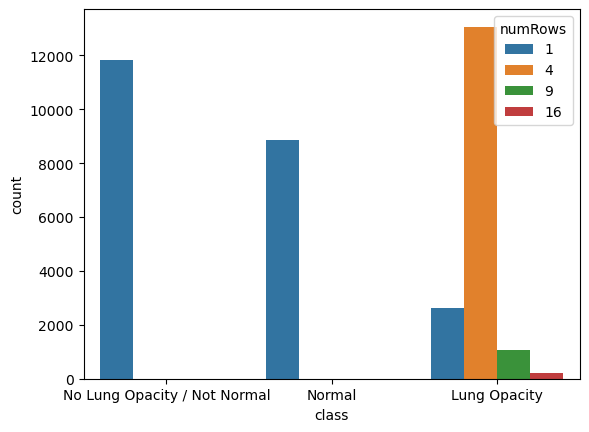

In [160]:
count_plot2 = sns.countplot(x='class', hue='numRows',data=df)

> Instead let's count the number of rows where 'x' is not empty. This lets us get an accurate count of the number of bounding boxes.

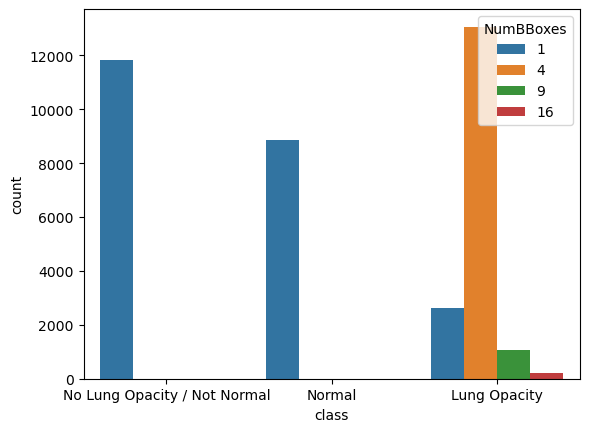

In [161]:
num_bboxes_df = df.groupby('patientId')['x'].count().to_frame('NumBBoxes').reset_index()
df2 = df.merge(num_bboxes_df, on='patientId', how='left')
count_plot3 = sns.countplot(x='class', hue='NumBBoxes', data=df2)